# **Project Name : ✨ Credit Card Dataset Analysis ✨**

AUTHOR : **Jamshed Butt** from **Data Science**


# **Introduction**

The sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.
<br></br>
Following is the Data Dictionary for Credit Card dataset :-
<br></br>
**CUST_ID :** Identification of Credit Card holder (Categorical)

**BALANCE :** Balance amount left in their account to make purchases (
BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)

**PURCHASES :** Amount of purchases made from account

**ONEOFF_PURCHASES :** Maximum purchase amount done in one-go

**INSTALLMENTS_PURCHASES :** Amount of purchase done in installment

**CASH_ADVANCE :** Cash in advance given by the user

**PURCHASES_FREQUENCY :** How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)

**ONEOFFPURCHASESFREQUENCY :** How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)

**PURCHASESINSTALLMENTSFREQUENCY :** How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)

**CASHADVANCEFREQUENCY :** How frequently the cash in advance being paid

**CASHADVANCETRX :** Number of Transactions made with "Cash in Advanced"

**PURCHASES_TRX :** Numbe of purchase transactions made

**CREDIT_LIMIT :** Limit of Credit Card for user

**PAYMENTS :** Amount of Payment done by user

**MINIMUM_PAYMENTS :** Minimum amount of payments made by user

**PRCFULLPAYMENT :** Percent of full payment paid by user

**TENURE :** Tenure of credit card service for user

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Import Libraries**

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import pylab

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN

from sklearn.metrics import silhouette_score

# **Load Dataset**

In [5]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/CC General/CC GENERAL.csv")
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [6]:
df.shape

(8950, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [8]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [9]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


# **Univariate Analysis**

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

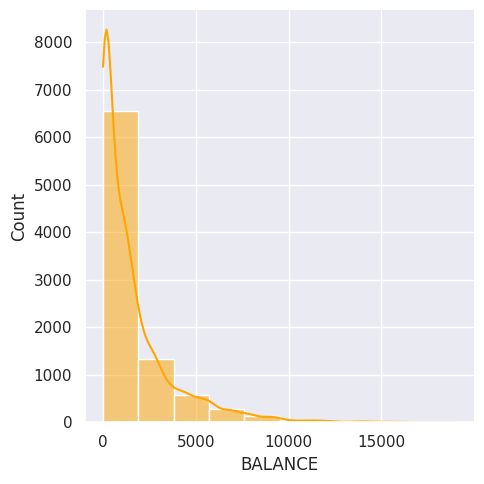

In [11]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["BALANCE"], kde=True, color="orange", bins=10)

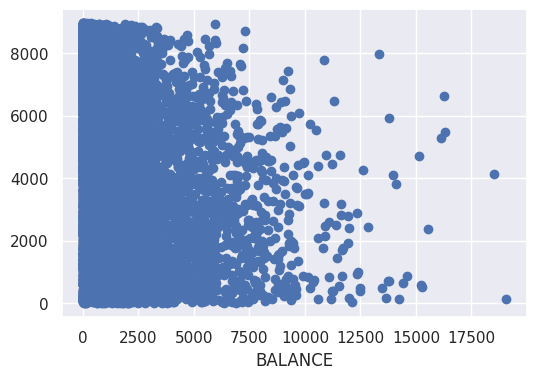

In [12]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['BALANCE'], y=df.index)
plt.xlabel("BALANCE")
plt.show()

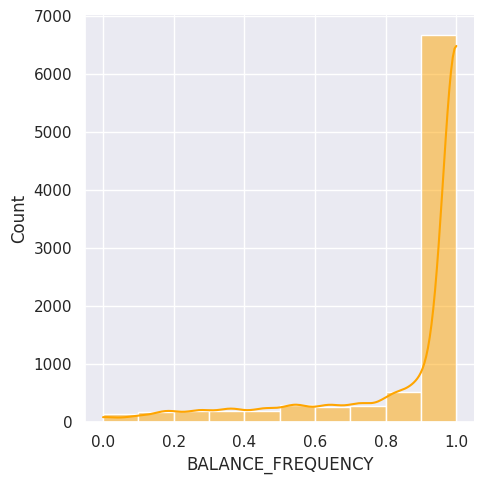

In [13]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["BALANCE_FREQUENCY"], kde=True, color="orange", bins=10)

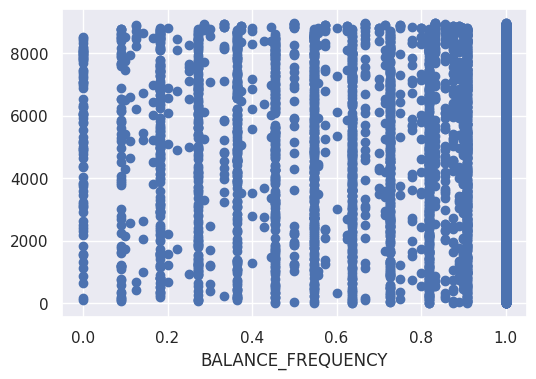

In [14]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['BALANCE_FREQUENCY'], y=df.index)
plt.xlabel("BALANCE_FREQUENCY")
plt.show()

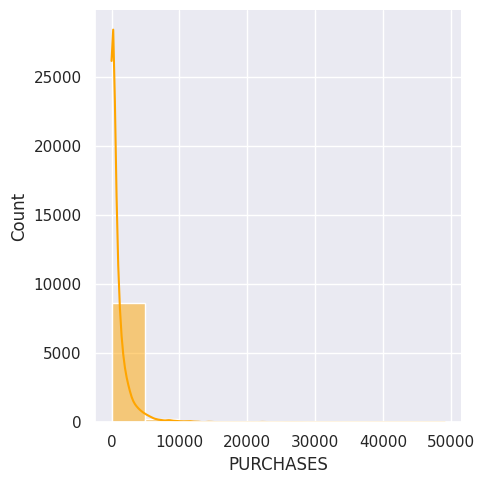

In [15]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PURCHASES"], kde=True, color="orange", bins=10)

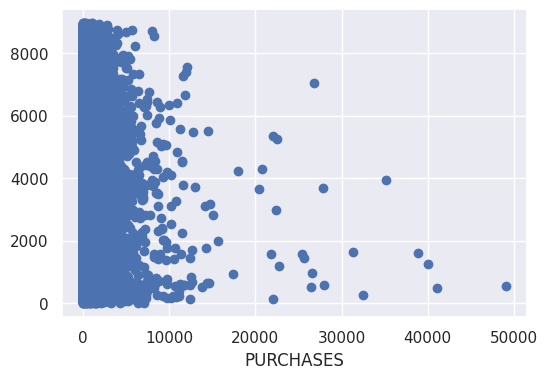

In [16]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PURCHASES'], y=df.index)
plt.xlabel("PURCHASES")
plt.show()

In [17]:
df["PURCHASES"].value_counts()

0.00       2044
45.65        27
60.00        16
150.00       16
300.00       13
           ... 
222.70        1
433.20        1
509.88        1
65.50         1
1093.25       1
Name: PURCHASES, Length: 6203, dtype: int64

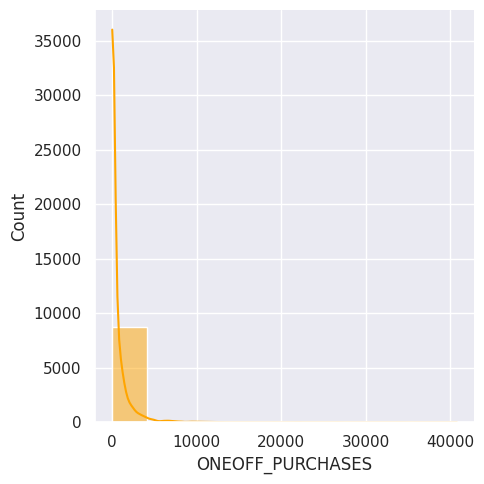

In [18]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["ONEOFF_PURCHASES"], kde=True, color="orange", bins=10)

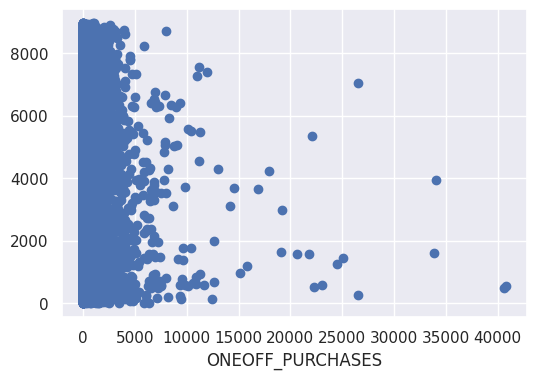

In [19]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['ONEOFF_PURCHASES'], y=df.index)
plt.xlabel("ONEOFF_PURCHASES")
plt.show()

In [20]:
df["ONEOFF_PURCHASES"].value_counts()

0.00       4302
45.65        46
50.00        17
200.00       15
60.00        13
           ... 
187.00        1
229.02        1
1020.00       1
75.50         1
1093.25       1
Name: ONEOFF_PURCHASES, Length: 4014, dtype: int64

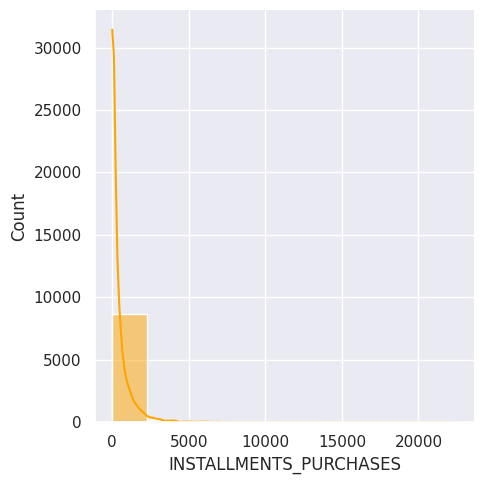

In [21]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["INSTALLMENTS_PURCHASES"], kde=True, color="orange", bins=10)

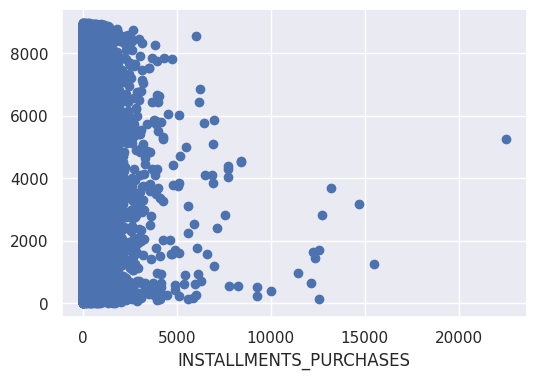

In [22]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['INSTALLMENTS_PURCHASES'], y=df.index)
plt.xlabel("INSTALLMENTS_PURCHASES")
plt.show()

In [23]:
df["INSTALLMENTS_PURCHASES"].value_counts()

0.00      3916
300.00      14
200.00      14
100.00      14
150.00      12
          ... 
276.62       1
590.76       1
945.46       1
414.48       1
144.40       1
Name: INSTALLMENTS_PURCHASES, Length: 4452, dtype: int64

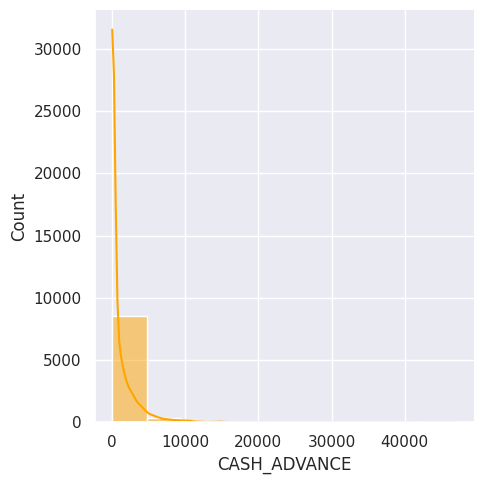

In [24]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["CASH_ADVANCE"], kde=True, color="orange", bins=10)

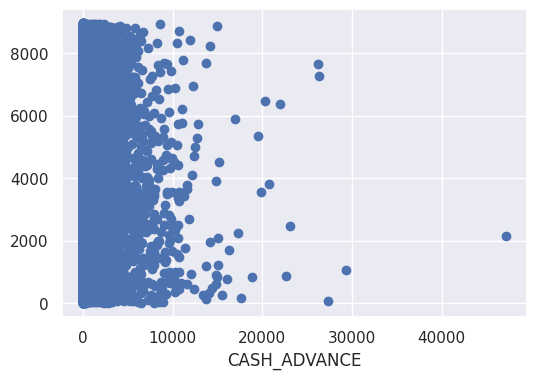

In [25]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['CASH_ADVANCE'], y=df.index)
plt.xlabel("CASH_ADVANCE")
plt.show()

In [26]:
df["CASH_ADVANCE"].value_counts()

0.000000       4628
495.425832        1
1486.243293       1
855.232779        1
3767.104707       1
               ... 
5187.029833       1
137.757459        1
124.941315        1
272.559361        1
127.040008        1
Name: CASH_ADVANCE, Length: 4323, dtype: int64

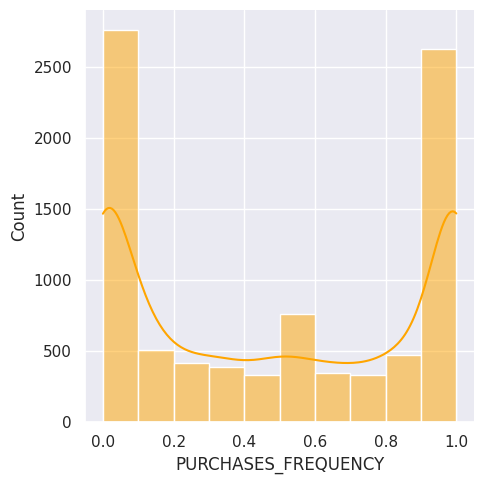

In [27]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PURCHASES_FREQUENCY"], kde=True, color="orange", bins=10)

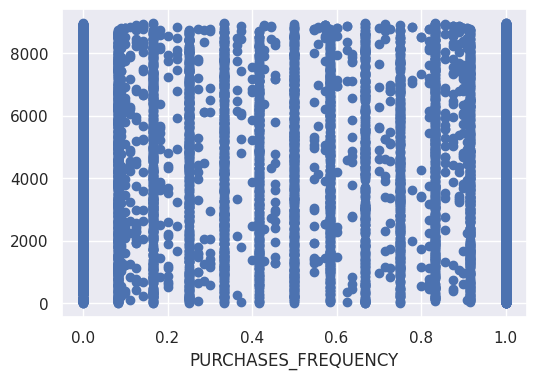

In [28]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PURCHASES_FREQUENCY'], y=df.index)
plt.xlabel("PURCHASES_FREQUENCY")
plt.show()

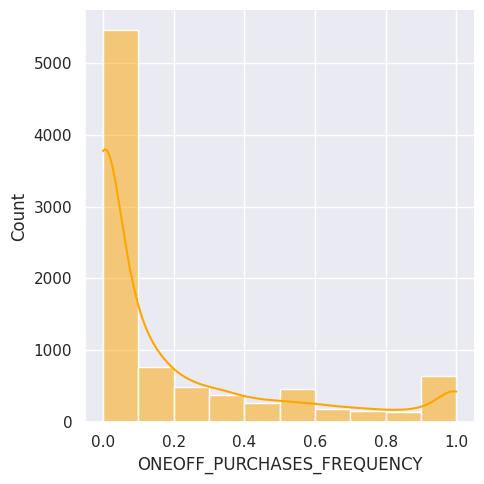

In [29]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["ONEOFF_PURCHASES_FREQUENCY"], kde=True, color="orange", bins=10)

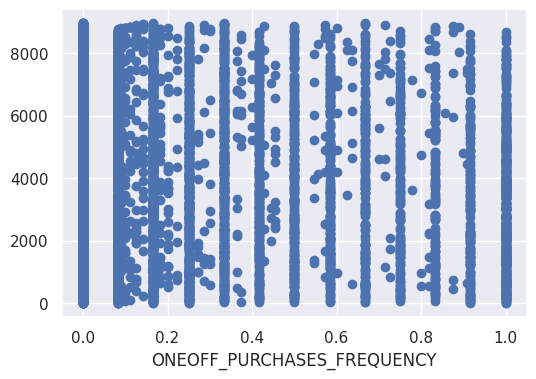

In [30]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['ONEOFF_PURCHASES_FREQUENCY'], y=df.index)
plt.xlabel("ONEOFF_PURCHASES_FREQUENCY")
plt.show()

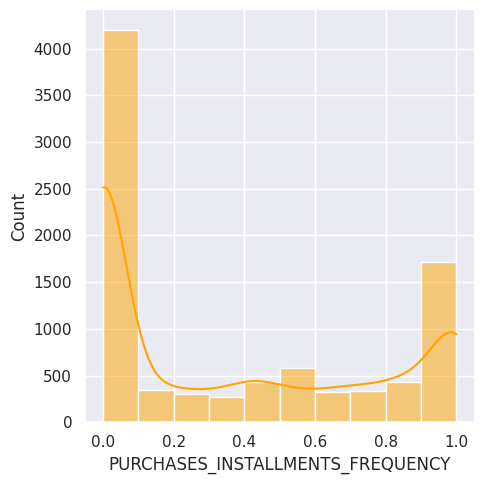

In [31]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PURCHASES_INSTALLMENTS_FREQUENCY"], kde=True, color="orange", bins=10)

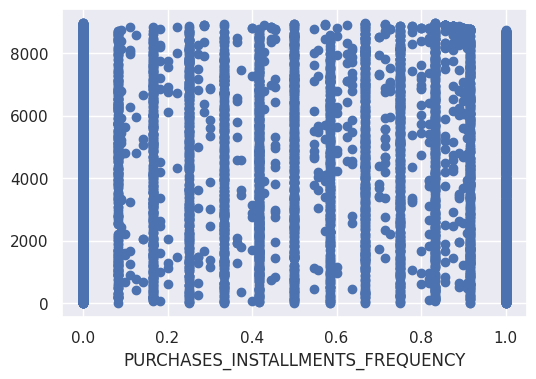

In [32]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PURCHASES_INSTALLMENTS_FREQUENCY'], y=df.index)
plt.xlabel("PURCHASES_INSTALLMENTS_FREQUENCY")
plt.show()

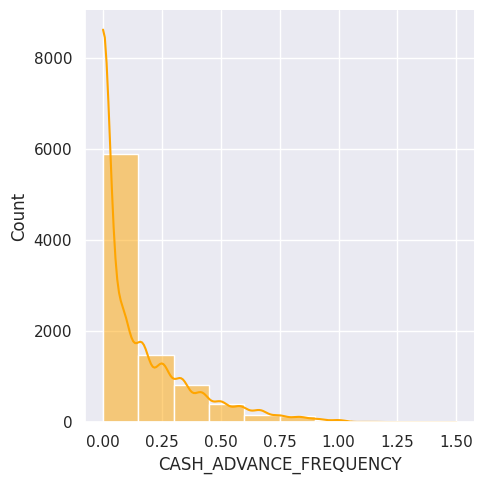

In [33]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["CASH_ADVANCE_FREQUENCY"], kde=True, color="orange", bins=10)

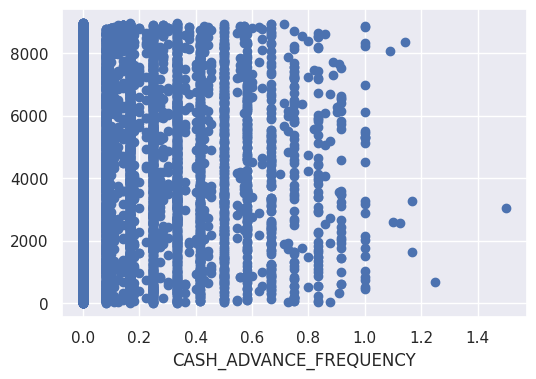

In [34]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['CASH_ADVANCE_FREQUENCY'], y=df.index)
plt.xlabel("CASH_ADVANCE_FREQUENCY")
plt.show()

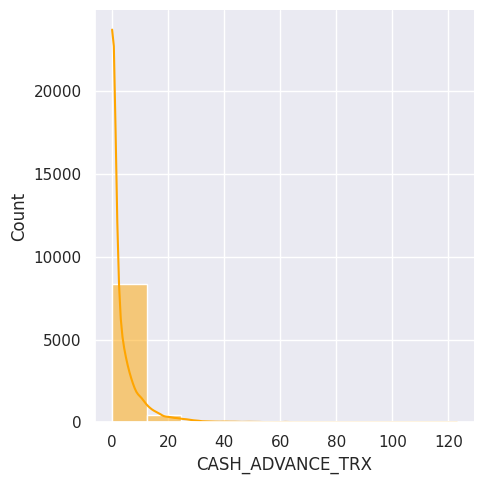

In [35]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["CASH_ADVANCE_TRX"], kde=True, color="orange", bins=10)

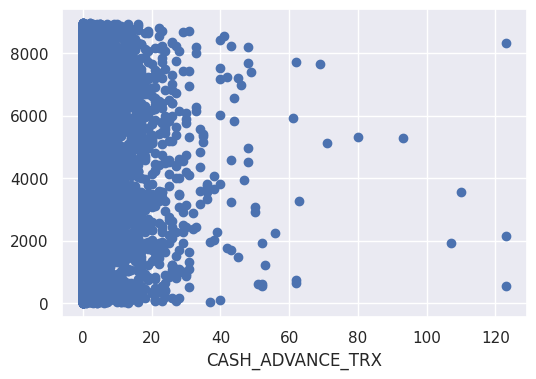

In [36]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['CASH_ADVANCE_TRX'], y=df.index)
plt.xlabel("CASH_ADVANCE_TRX")
plt.show()

In [37]:
df["CASH_ADVANCE_TRX"].value_counts()

0      4628
1       887
2       620
3       436
4       384
       ... 
39        1
56        1
107       1
53        1
41        1
Name: CASH_ADVANCE_TRX, Length: 65, dtype: int64

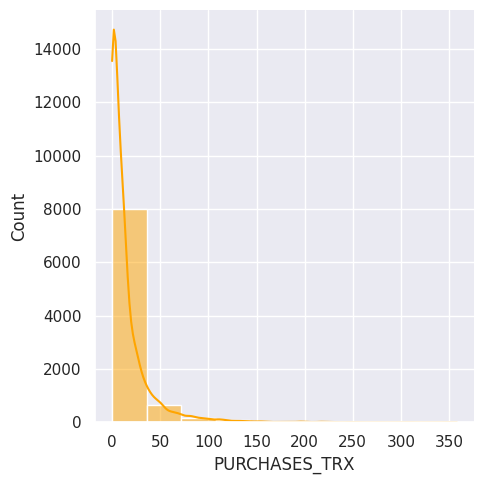

In [38]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PURCHASES_TRX"], kde=True, color="orange", bins=10)

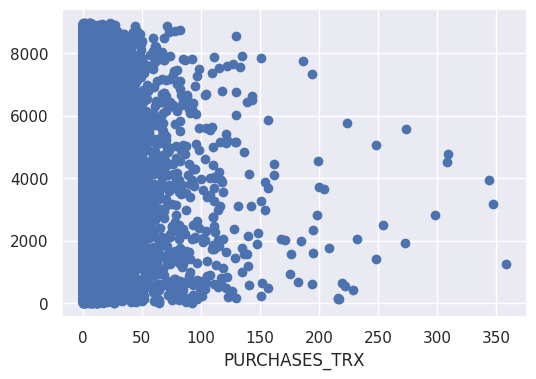

In [39]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PURCHASES_TRX'], y=df.index)
plt.xlabel("PURCHASES_TRX")
plt.show()

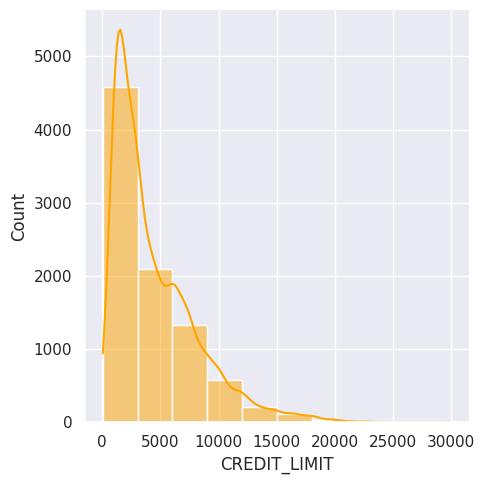

In [40]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["CREDIT_LIMIT"], kde=True, color="orange", bins=10)

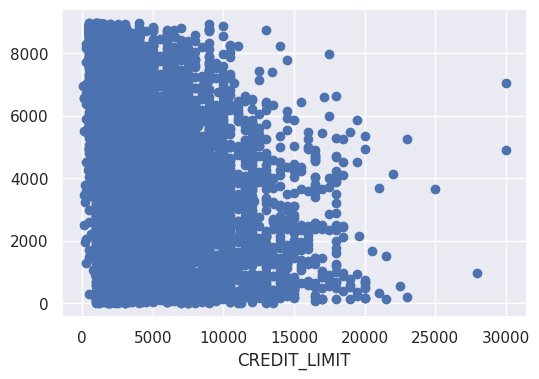

In [41]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['CREDIT_LIMIT'], y=df.index)
plt.xlabel("CREDIT_LIMIT")
plt.show()

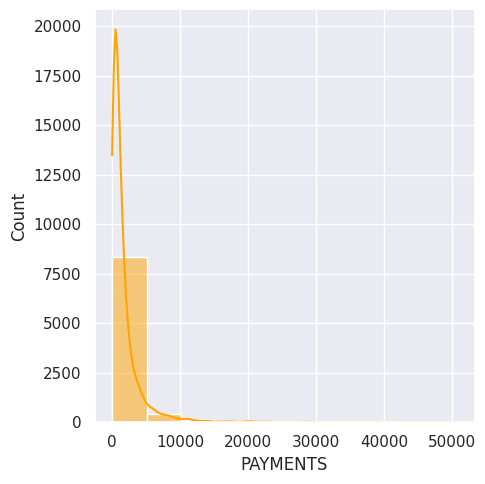

In [42]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PAYMENTS"], kde=True, color="orange", bins=10)

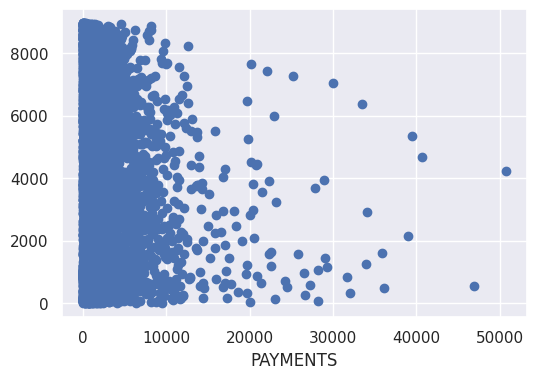

In [43]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PAYMENTS'], y=df.index)
plt.xlabel("PAYMENTS")
plt.show()

In [44]:
df["PAYMENTS"].value_counts()

0.000000        240
201.802084        1
398.316441        1
826.036748        1
2571.573214       1
               ... 
14176.748670      1
6200.550587       1
1877.023036       1
372.093413        1
63.165404         1
Name: PAYMENTS, Length: 8711, dtype: int64

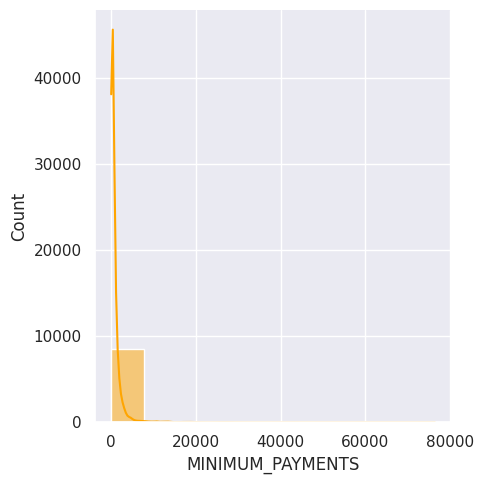

In [45]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["MINIMUM_PAYMENTS"], kde=True, color="orange", bins=10)

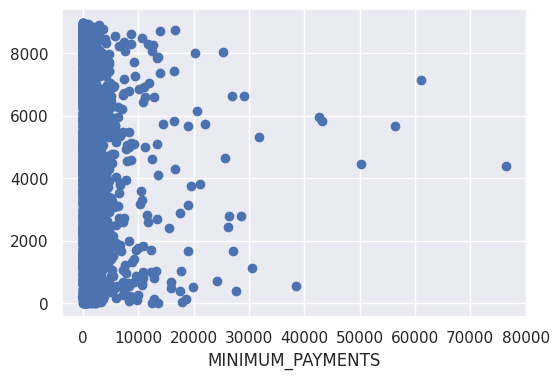

In [46]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['MINIMUM_PAYMENTS'], y=df.index)
plt.xlabel("MINIMUM_PAYMENTS")
plt.show()

In [47]:
df["MINIMUM_PAYMENTS"].value_counts()

299.351881    2
342.286490    1
184.464721    1
276.486072    1
309.140865    1
             ..
181.773223    1
711.894455    1
256.522546    1
127.799107    1
88.288956     1
Name: MINIMUM_PAYMENTS, Length: 8636, dtype: int64

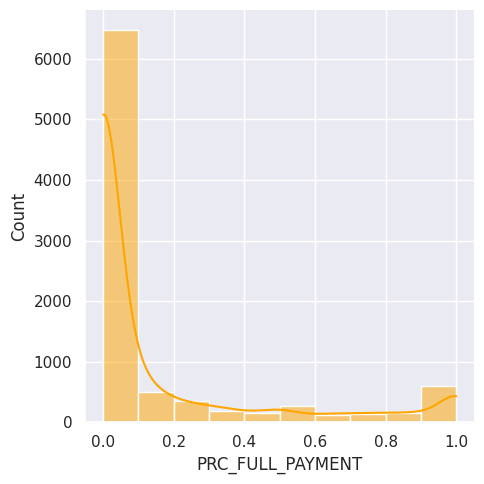

In [48]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["PRC_FULL_PAYMENT"], kde=True, color="orange", bins=10)

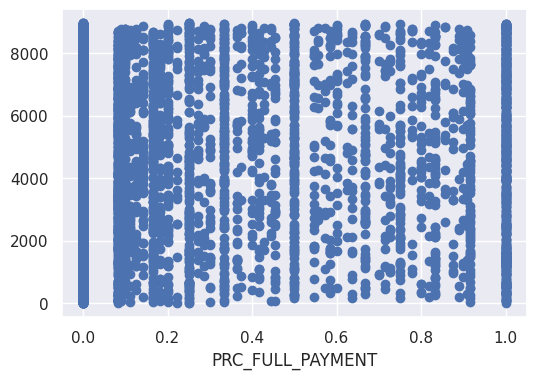

In [49]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['PRC_FULL_PAYMENT'], y=df.index)
plt.xlabel("PRC_FULL_PAYMENT")
plt.show()

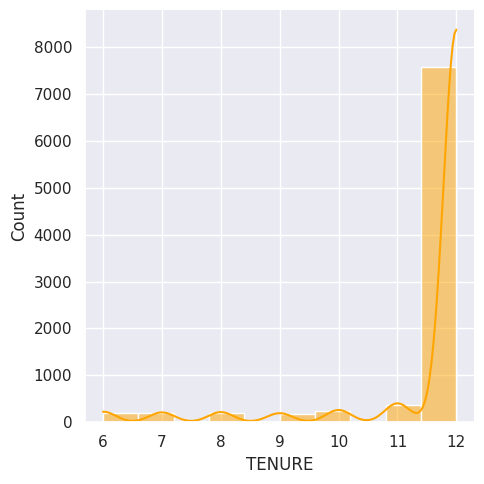

In [50]:
sns.set(rc={"figure.figsize":(6,4)})
sns.displot(df["TENURE"], kde=True, color="orange", bins=10)

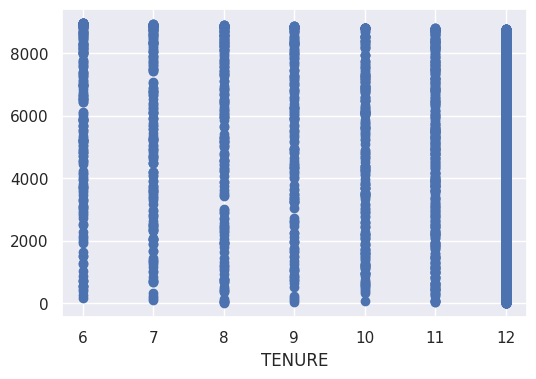

In [51]:
plt.figure(figsize=(6,4))
plt.scatter(x=df['TENURE'], y=df.index)
plt.xlabel("TENURE")
plt.show()

# **EDA (Exploratory Data Analysis)**

#### **Remove Duplicate**

In [52]:
duplicate = df.duplicated()
print(duplicate.sum())

0


#### **Check And Remove NaN Values**

In [53]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [54]:
df["CREDIT_LIMIT"].value_counts()

3000.000000     784
1500.000000     722
1200.000000     621
1000.000000     614
2500.000000     612
               ... 
9200.000000       1
13550.000000      1
7227.272727       1
11250.000000      1
1833.333333       1
Name: CREDIT_LIMIT, Length: 205, dtype: int64

In [55]:
df["CREDIT_LIMIT"] = df["CREDIT_LIMIT"].fillna(df["CREDIT_LIMIT"].mean())

In [56]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          0
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [57]:
df["MINIMUM_PAYMENTS"].value_counts()

299.351881    2
342.286490    1
184.464721    1
276.486072    1
309.140865    1
             ..
181.773223    1
711.894455    1
256.522546    1
127.799107    1
88.288956     1
Name: MINIMUM_PAYMENTS, Length: 8636, dtype: int64

In [58]:
df["MINIMUM_PAYMENTS"] = df["MINIMUM_PAYMENTS"].fillna(df["MINIMUM_PAYMENTS"].mean())

In [59]:
df.isnull().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

#### **Remove Outlier**

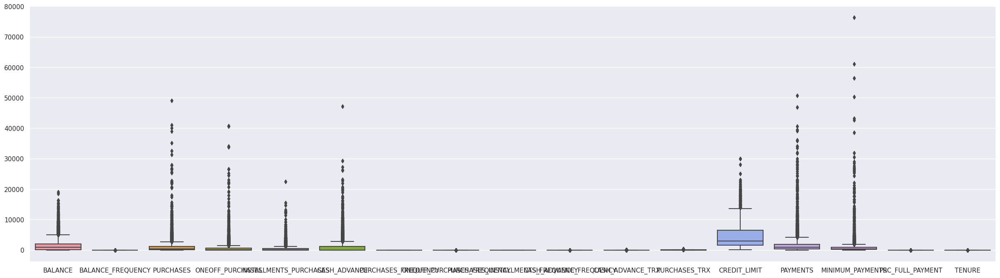

In [60]:
plt.figure(figsize=(30,8))
sns.boxplot(data=df)
plt.show()

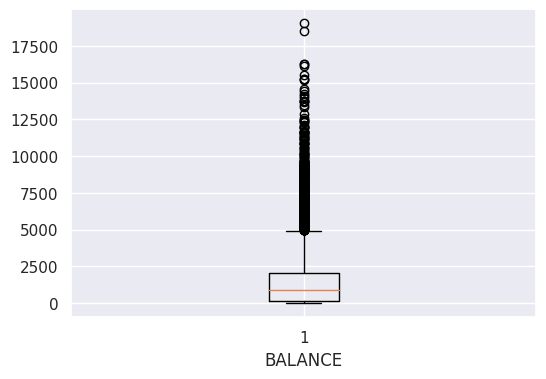

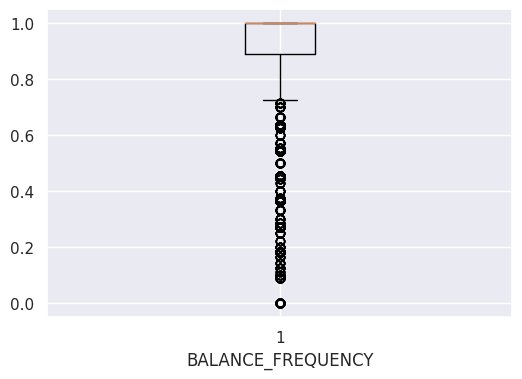

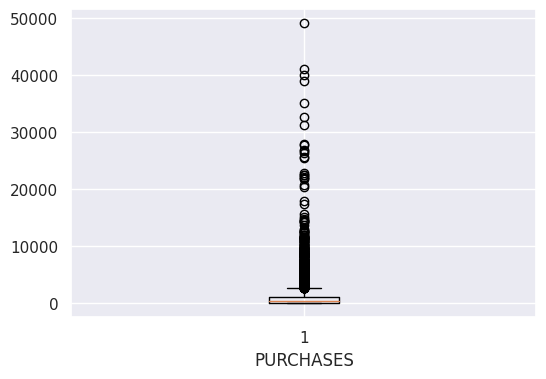

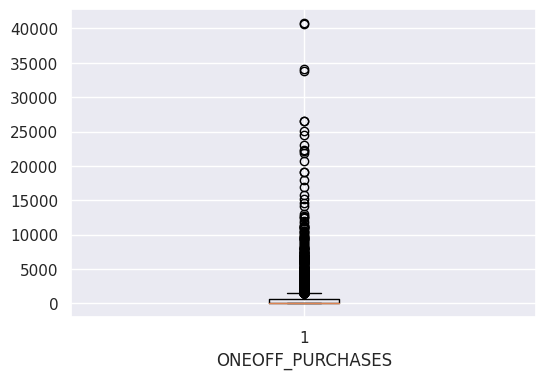

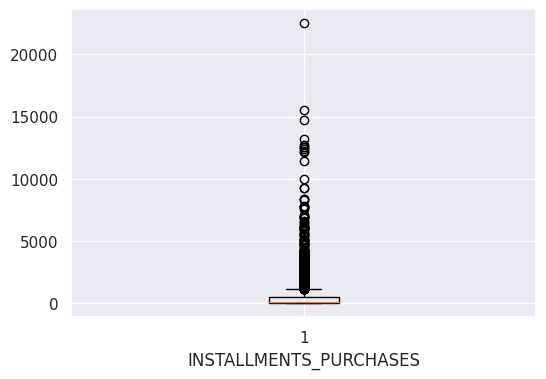

...

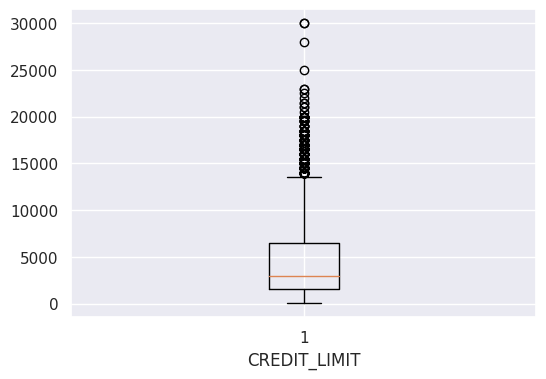

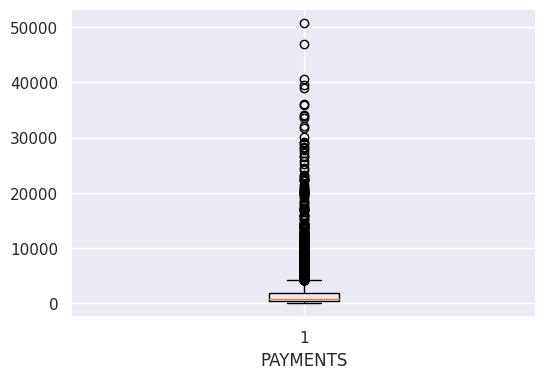

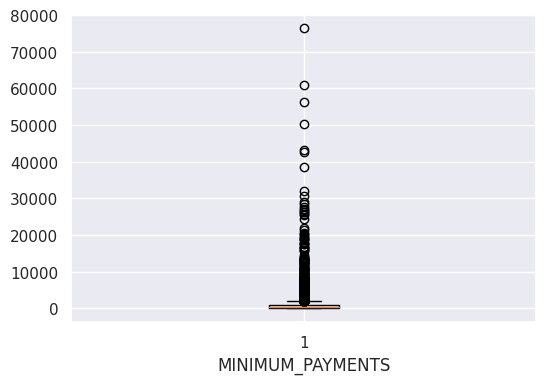

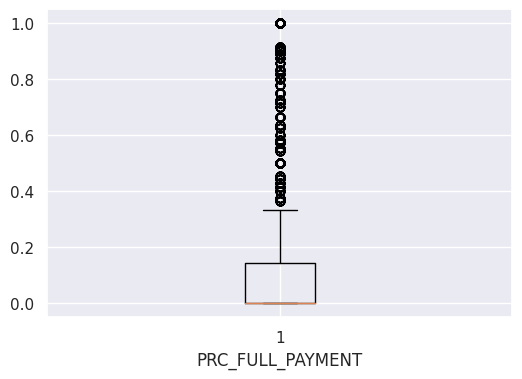

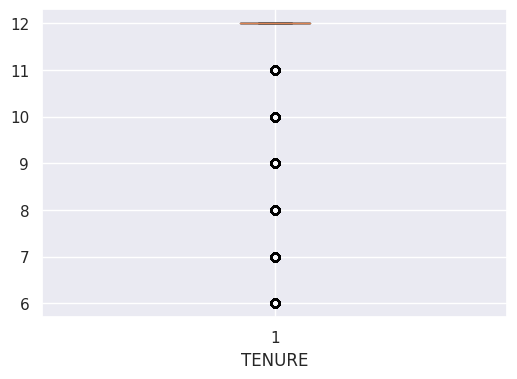

In [61]:
num_col = df.select_dtypes(["float64","int64"])
for i in num_col.columns:
  plt.boxplot(df[i])
  plt.xlabel(i)
  plt.show()

In [62]:
df["TENURE"].value_counts()

12    7584
11     365
10     236
6      204
8      196
7      190
9      175
Name: TENURE, dtype: int64

In [63]:
print(df.columns.get_loc('TENURE'))

17


In [64]:
def remove_outlier(col):
  sorted(col)
  Q1,Q3 = col.quantile([0.25,0.75])
  IQR = Q3 - Q1
  lower_range = Q1 - (1.5 * IQR)
  upper_range = Q3 + (1.5 * IQR)
  return lower_range,upper_range

In [65]:
num_col = df.select_dtypes(["float64","int64"])
for i in num_col.columns:
  if df.columns.get_loc(i) == 17:
    pass
  else:
    lower_range,upper_range = remove_outlier(df[i])
    df[i] = np.where(df[i] > upper_range, upper_range, df[i])
    df[i] = np.where(df[i] < lower_range, lower_range, df[i])

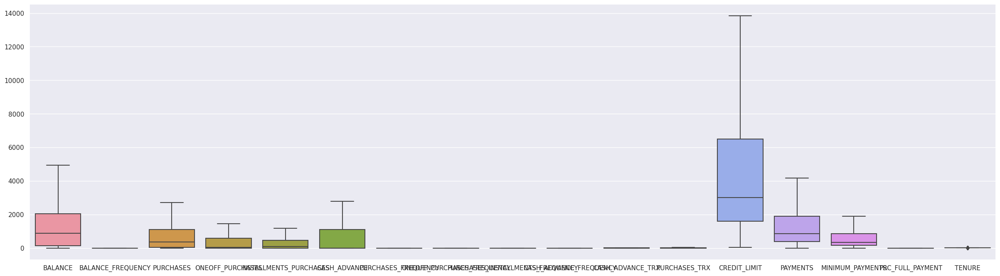

In [66]:
plt.figure(figsize=(30,8))
sns.boxplot(data=df)
plt.show()

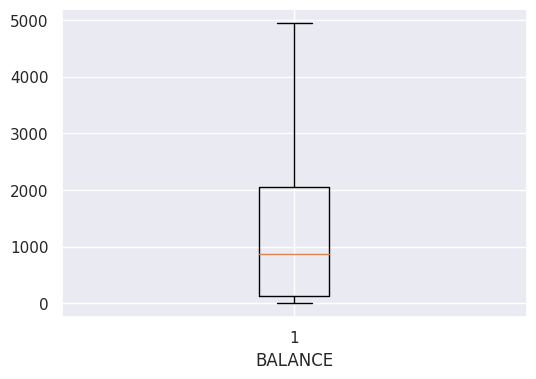

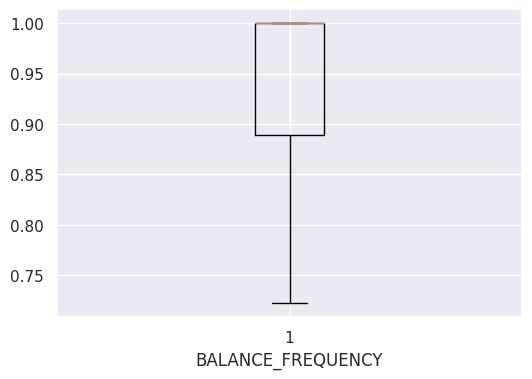

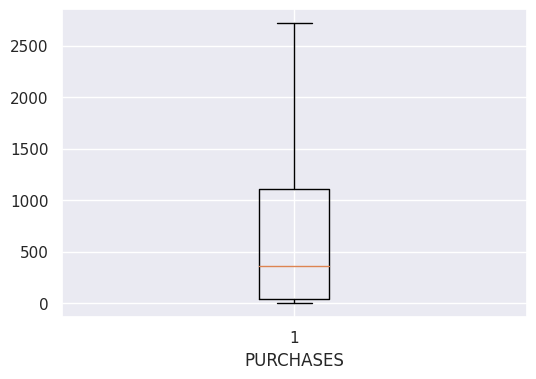

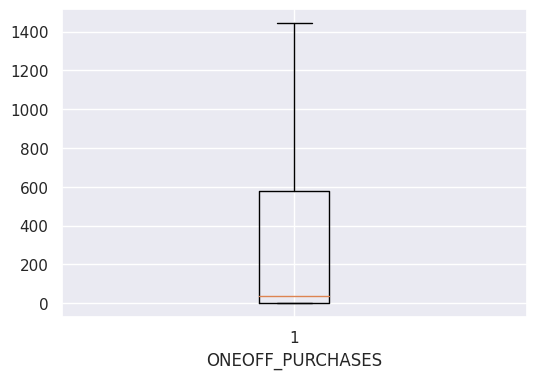

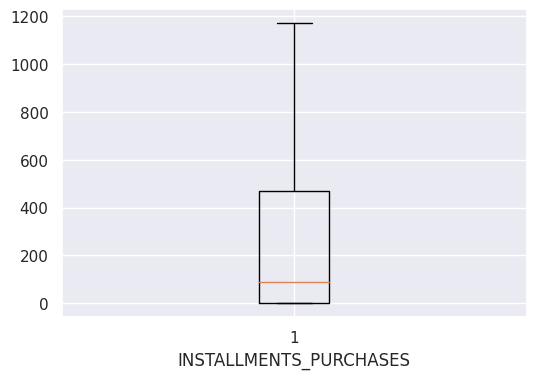

...

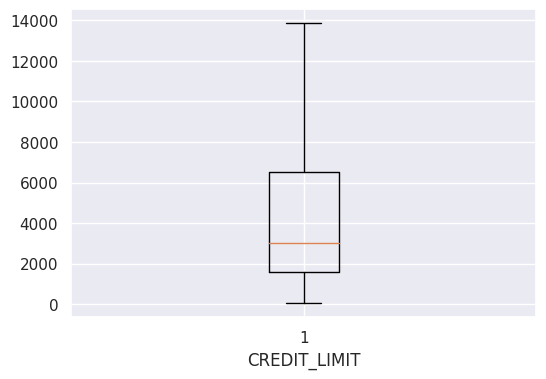

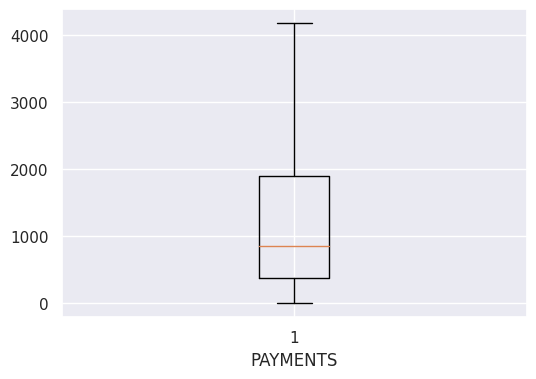

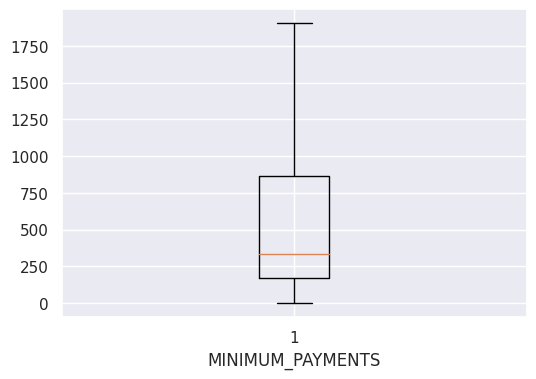

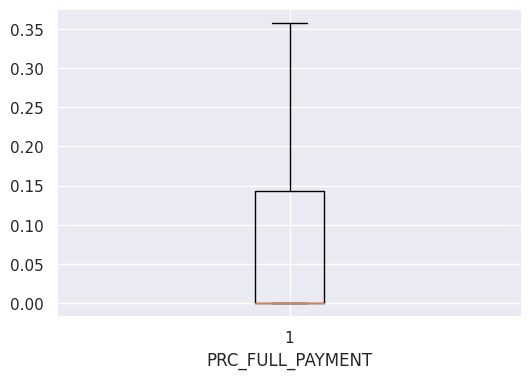

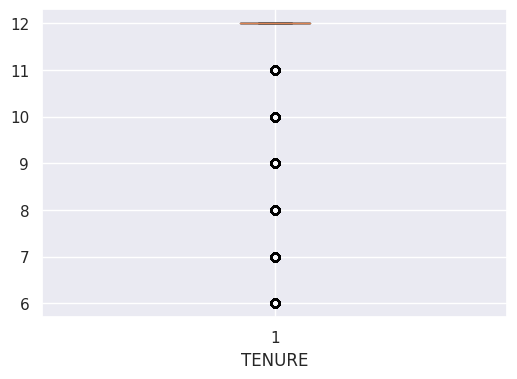

In [67]:
num_col = df.select_dtypes(["float64","int64"])
for i in num_col.columns:
  plt.boxplot(df[i])
  plt.xlabel(i)
  plt.show()

#### **Bivariate Analysis**

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   float64
 12  PURCHA

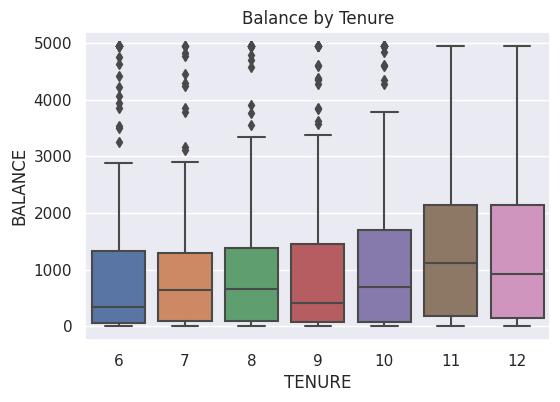

In [69]:
sns.boxplot(x='TENURE', y='BALANCE', data=df)
plt.title('Balance by Tenure')
plt.xlabel("TENURE")
plt.ylabel("BALANCE")
plt.show()

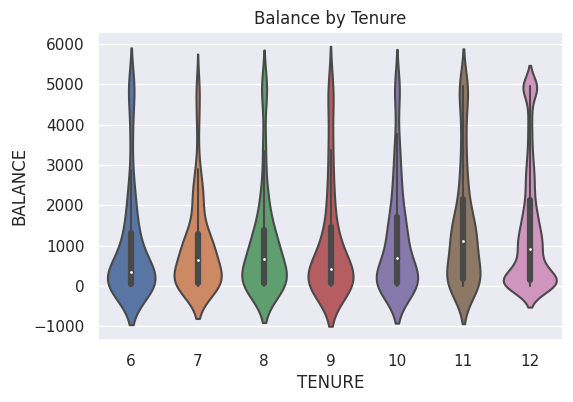

In [70]:
sns.violinplot(x='TENURE', y='BALANCE', data=df)
plt.title('Balance by Tenure')
plt.show()

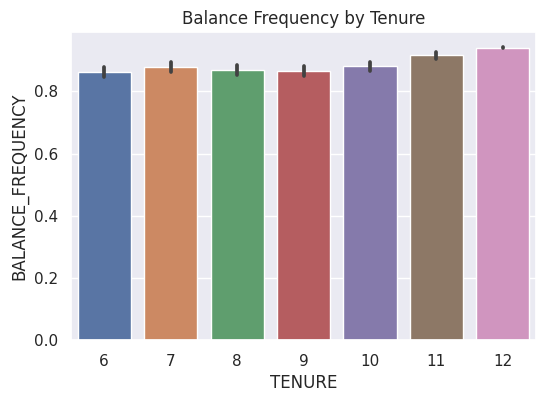

In [71]:
sns.barplot(x='TENURE', y='BALANCE_FREQUENCY', data=df)
plt.title('Balance Frequency by Tenure')
plt.show()

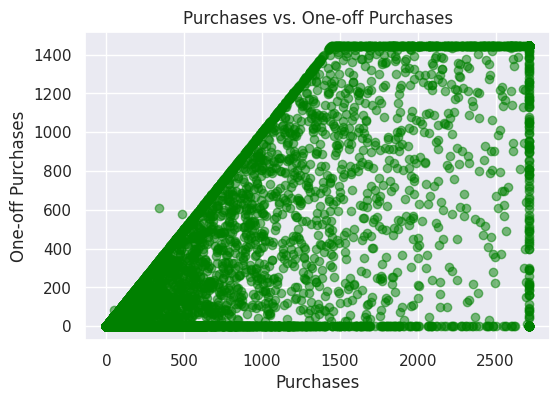

In [72]:
plt.scatter(df['PURCHASES'], df['ONEOFF_PURCHASES'], alpha=0.5, color='green')
plt.xlabel('Purchases')
plt.ylabel('One-off Purchases')
plt.title('Purchases vs. One-off Purchases')
plt.show()

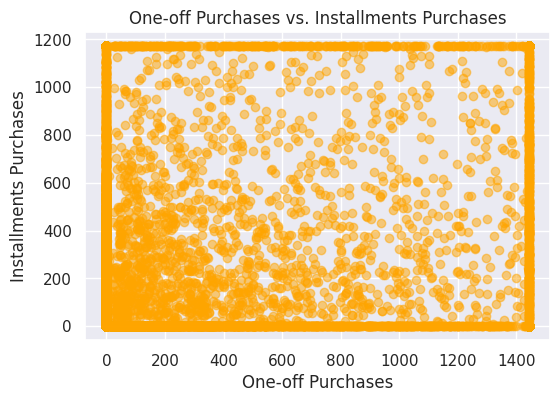

In [73]:
plt.scatter(df['ONEOFF_PURCHASES'], df['INSTALLMENTS_PURCHASES'], alpha=0.5, color='orange')
plt.xlabel('One-off Purchases')
plt.ylabel('Installments Purchases')
plt.title('One-off Purchases vs. Installments Purchases')
plt.show()

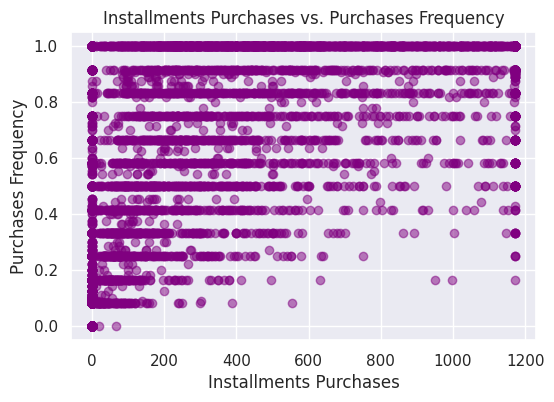

In [74]:
plt.scatter(df['INSTALLMENTS_PURCHASES'], df['PURCHASES_FREQUENCY'], alpha=0.5, color='purple')
plt.xlabel('Installments Purchases')
plt.ylabel('Purchases Frequency')
plt.title('Installments Purchases vs. Purchases Frequency')
plt.show()

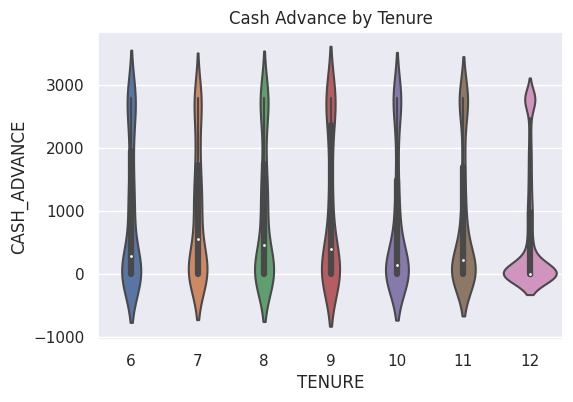

In [75]:
sns.violinplot(x='TENURE', y='CASH_ADVANCE', data=df)
plt.title('Cash Advance by Tenure')
plt.show()

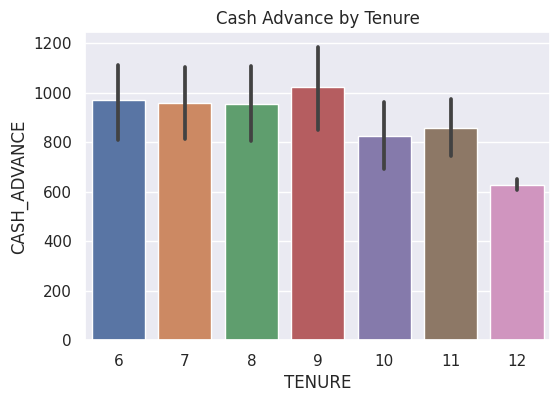

In [76]:
sns.barplot(x='TENURE', y='CASH_ADVANCE', data=df)
plt.title('Cash Advance by Tenure')
plt.show()

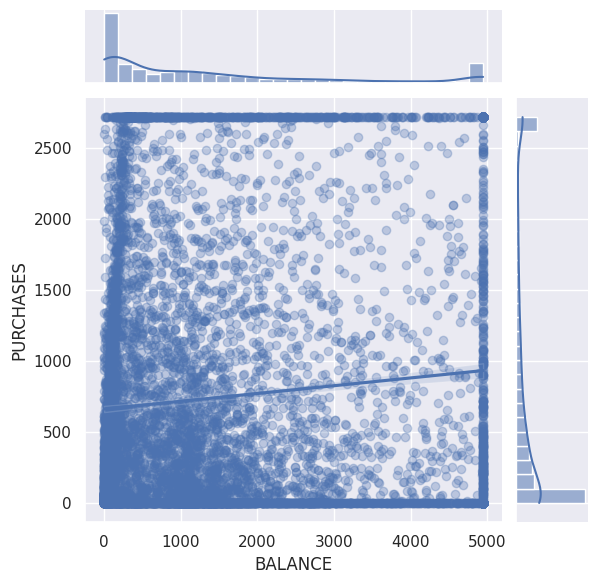

In [77]:
sns.jointplot(x='BALANCE', y='PURCHASES', data=df, kind='reg', scatter_kws={'alpha':0.3})
plt.show()

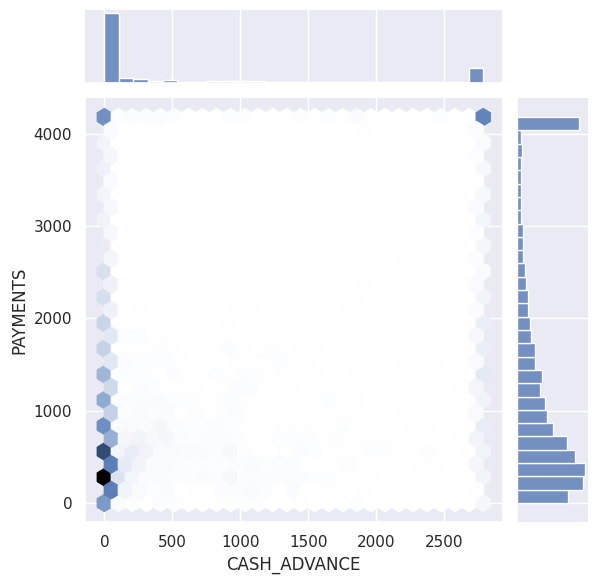

In [78]:
sns.jointplot(x='CASH_ADVANCE', y='PAYMENTS', data=df, kind='hex')
plt.show()

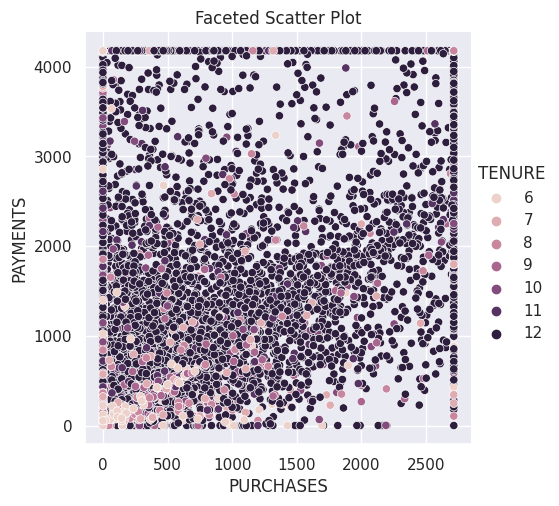

In [79]:
sns.relplot(x='PURCHASES', y='PAYMENTS', hue='TENURE', data=df)
plt.title('Faceted Scatter Plot')
plt.show()

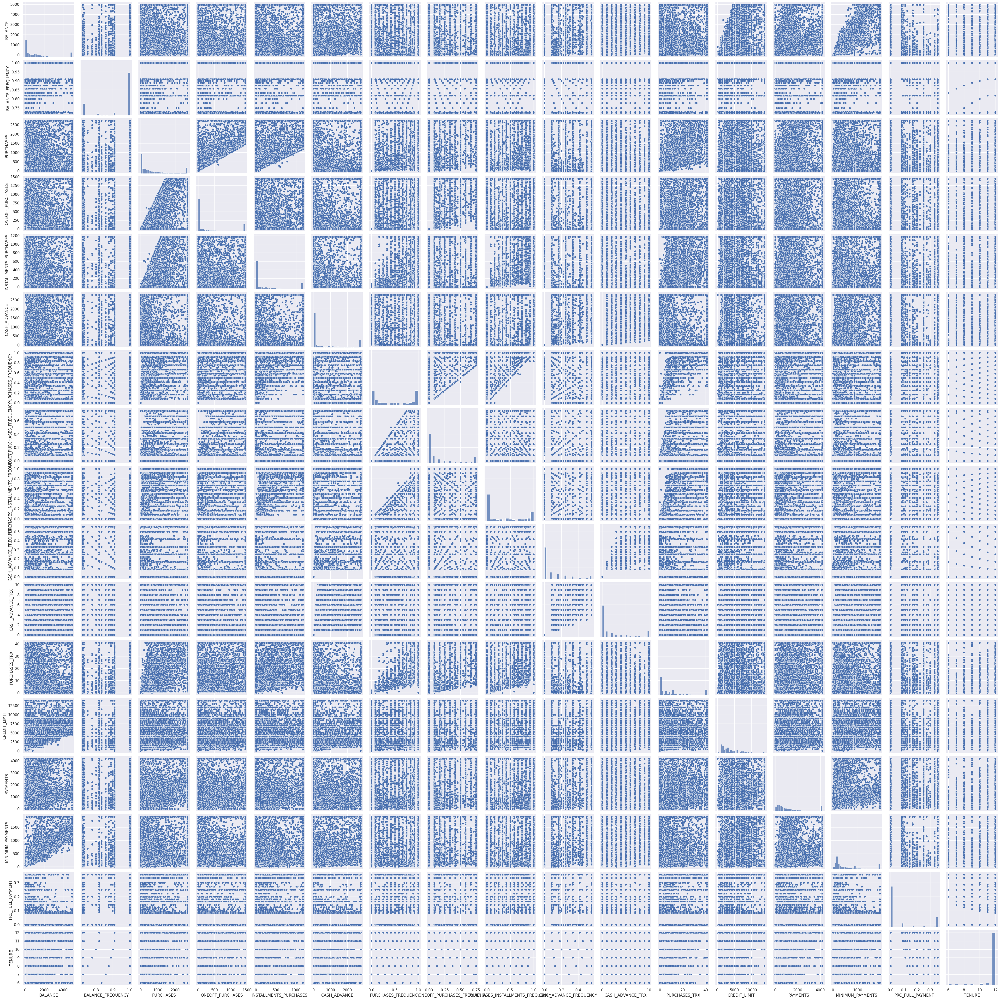

In [80]:
sns.pairplot(df)
plt.show()

<ipython-input-81-f7122f16c753>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm')


<Axes: >

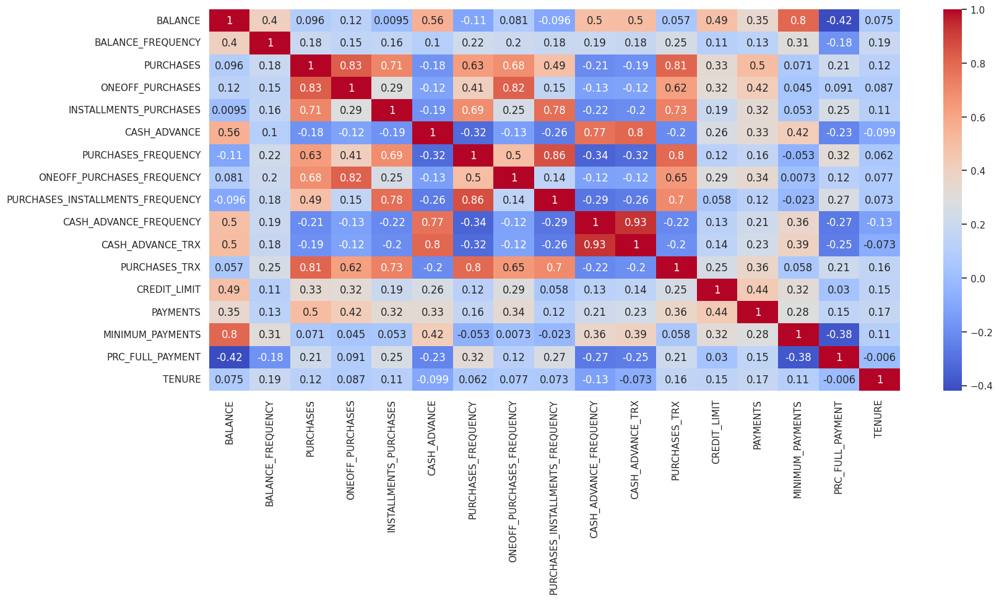

In [81]:
fig, ax = plt.subplots(figsize=(18, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


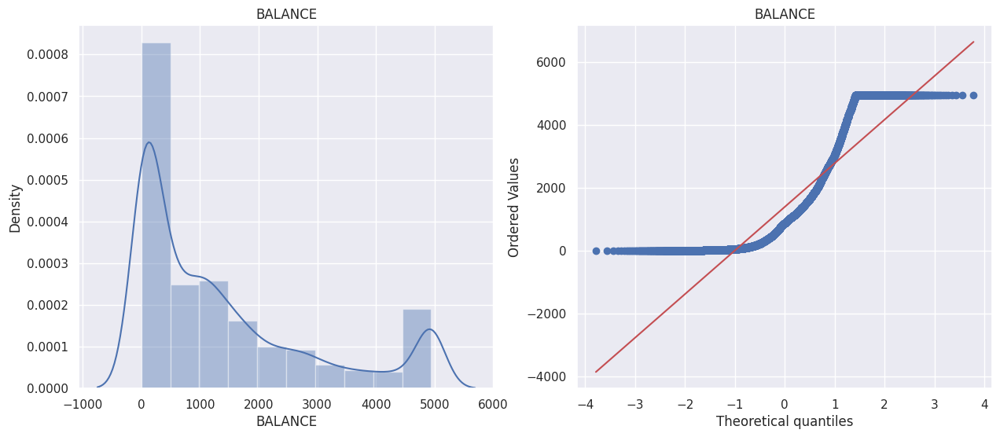

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


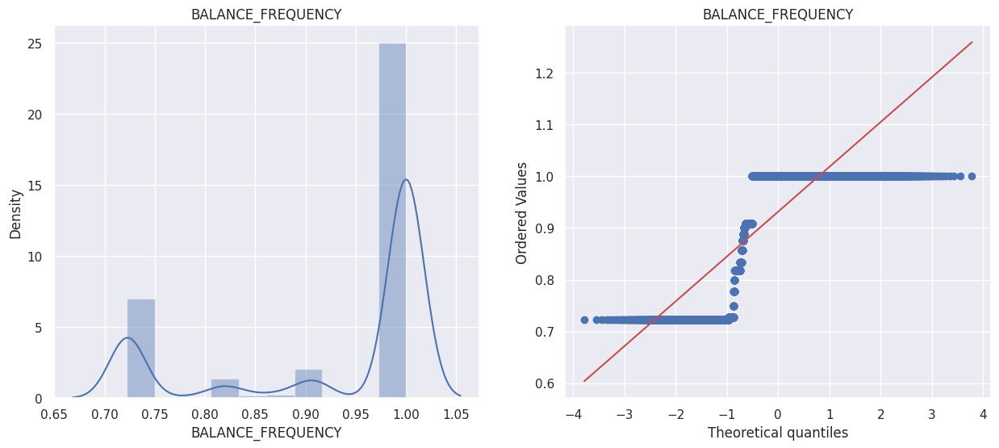

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


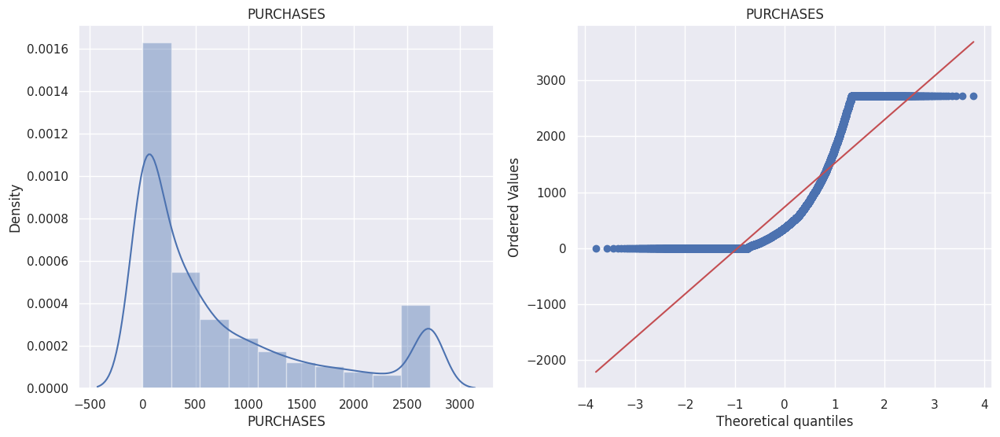

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


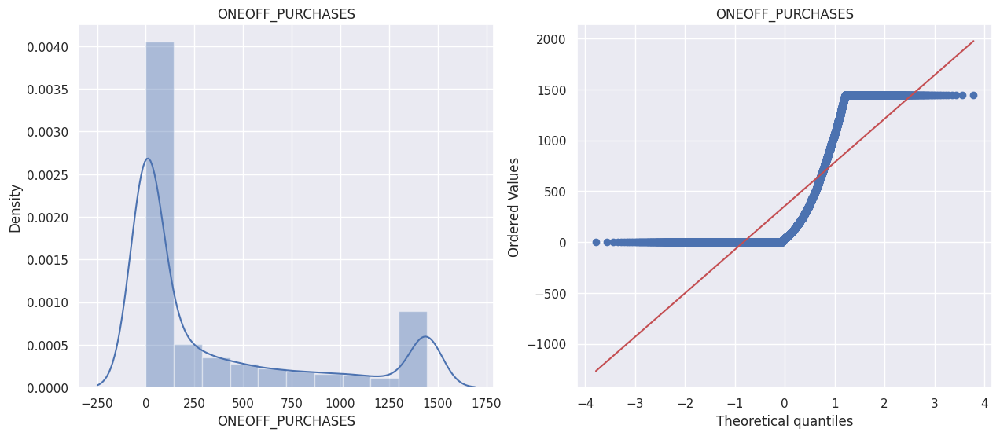

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


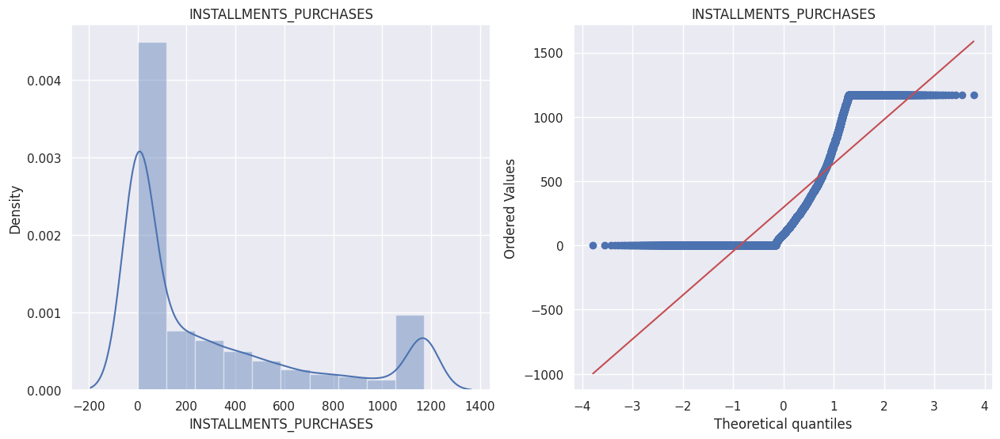

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


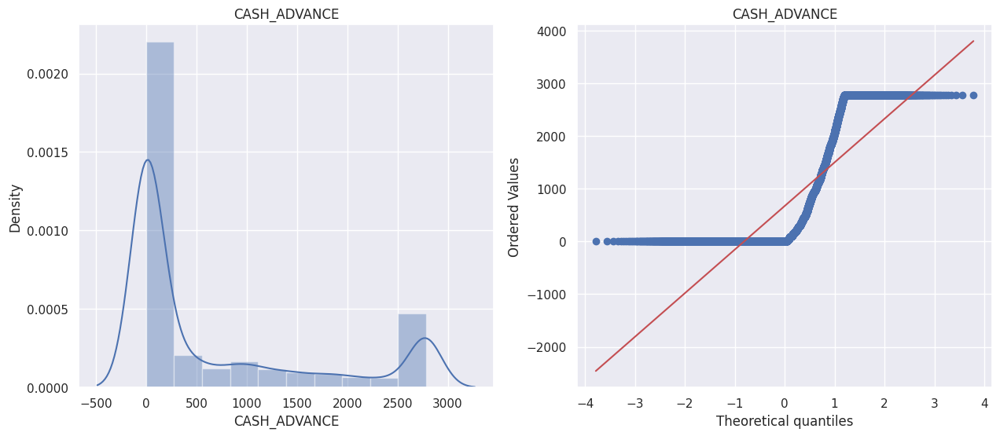

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


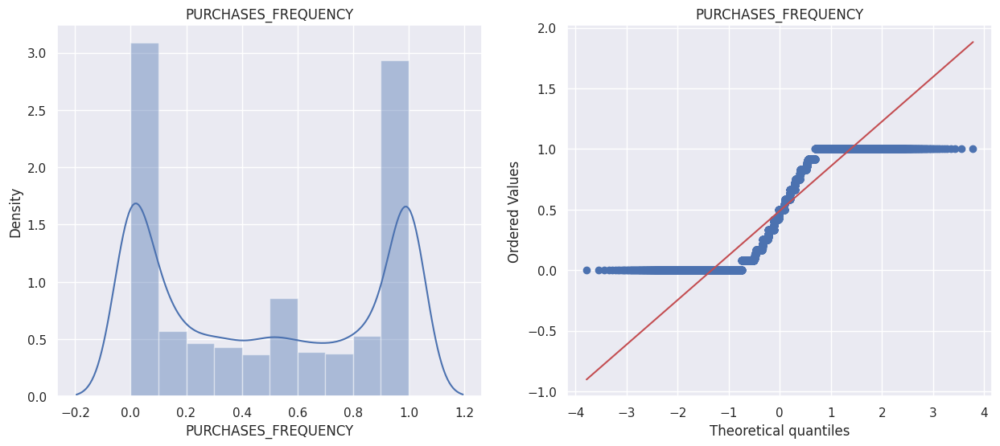

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


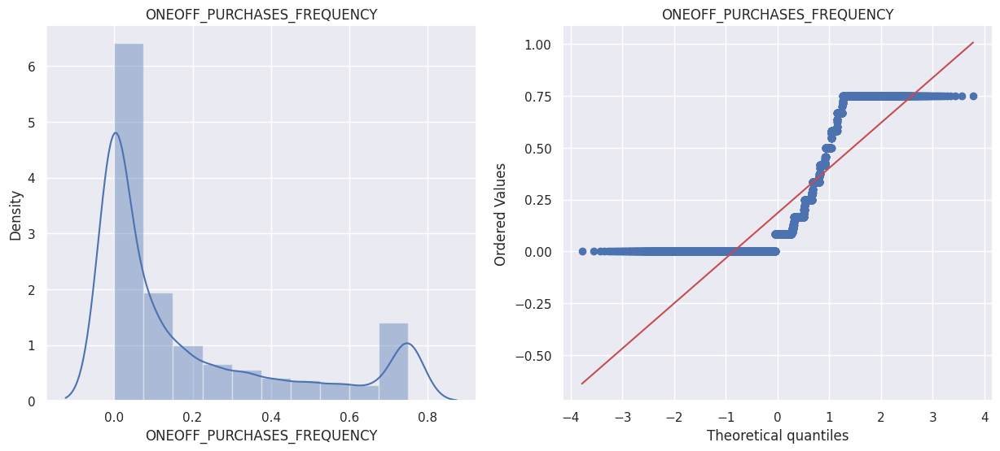

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


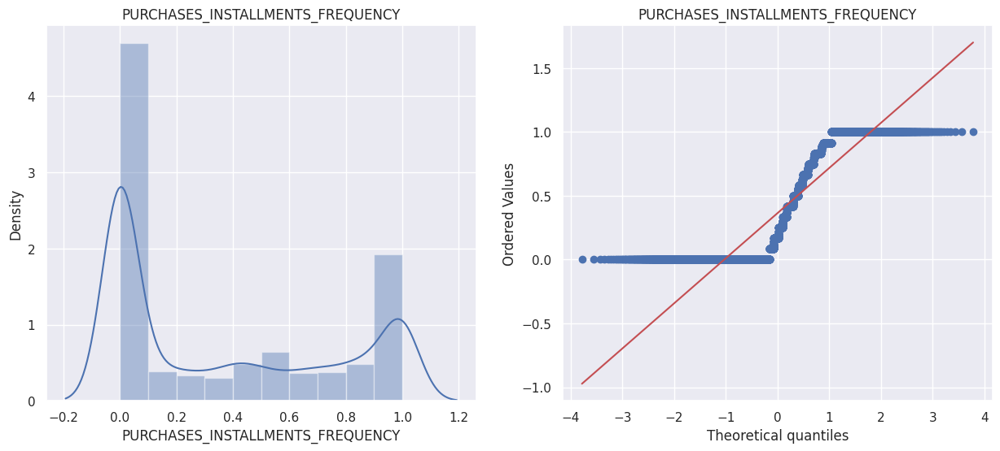

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


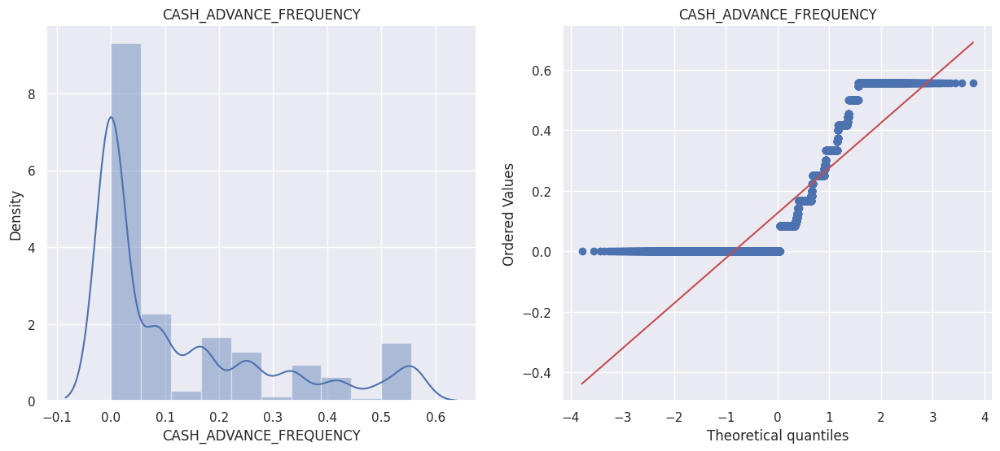

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


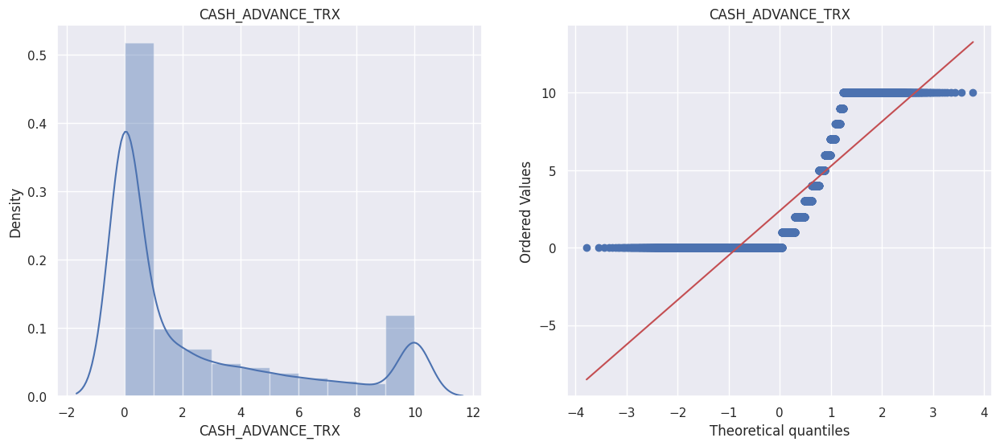

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


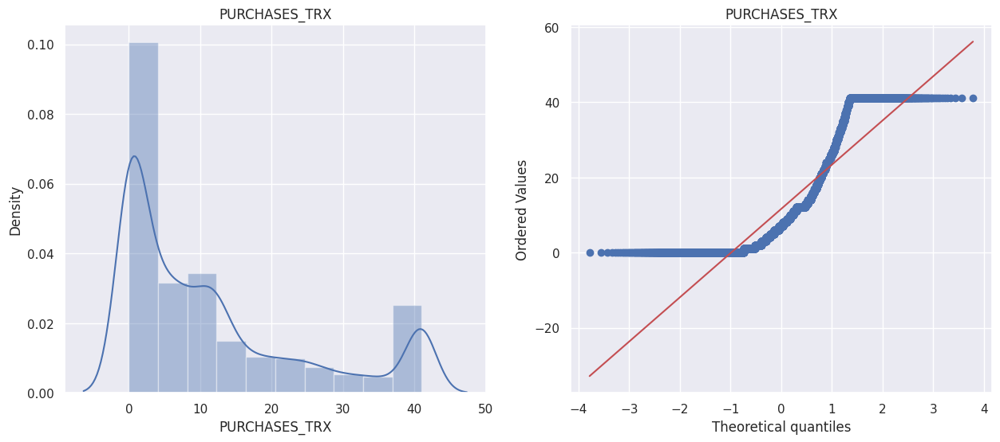

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


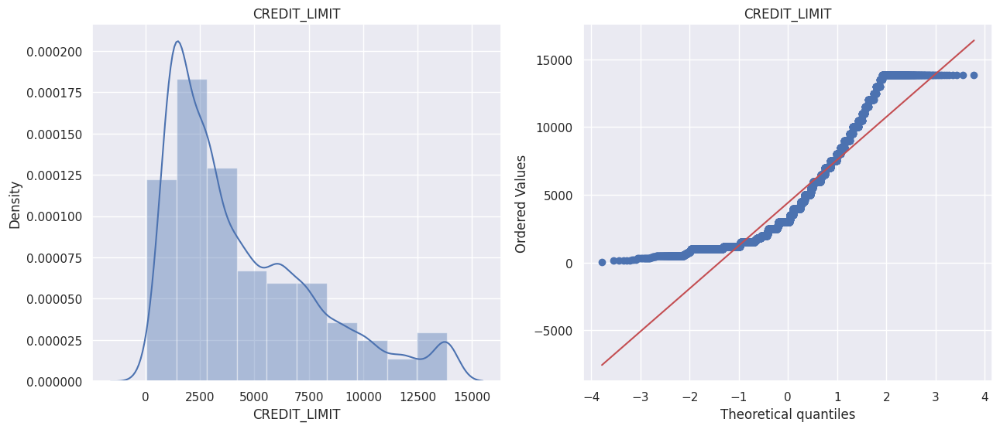

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


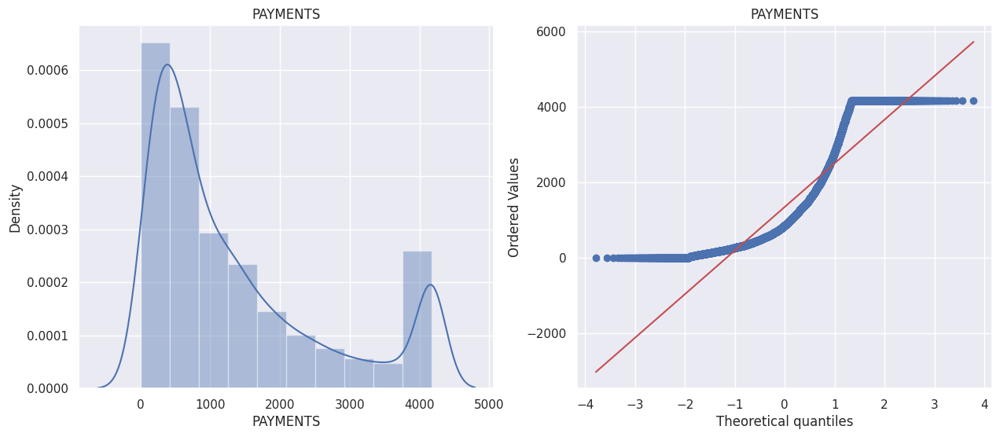

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


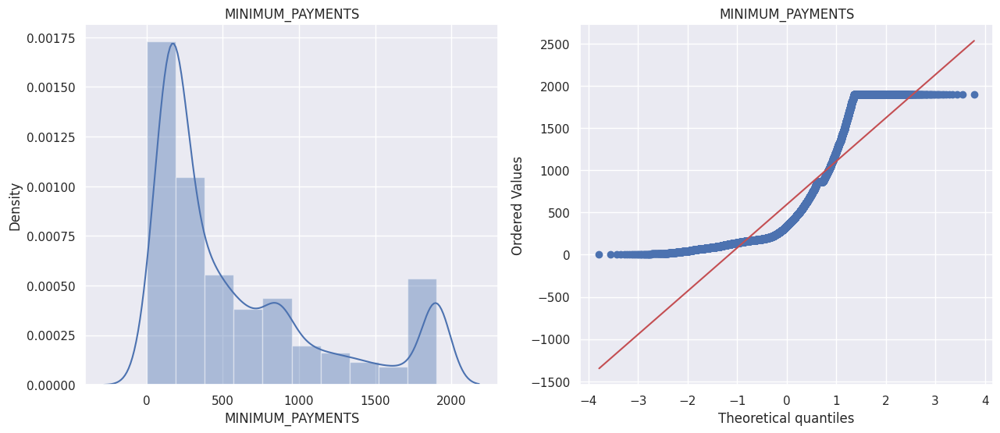

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


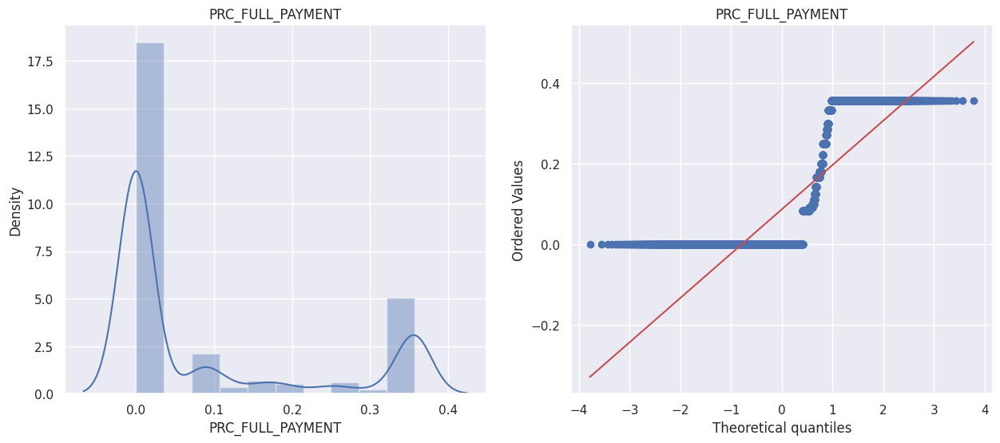

<ipython-input-82-7af58d2ef5aa>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(num_cols[variable], kde=True, bins=10)


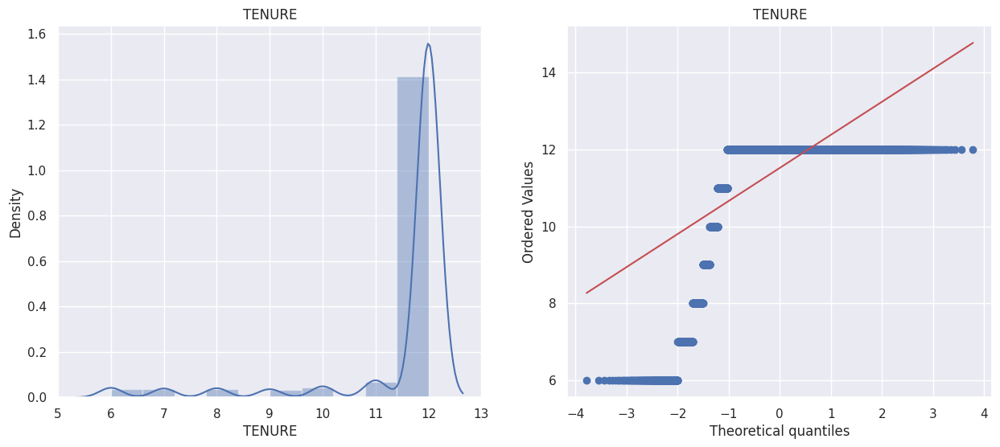

In [82]:
num_cols = df.select_dtypes(include=["int64","float64"])
def plots(num_cols, variable):
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    #num_cols[variable].hist()
    sns.distplot(num_cols[variable], kde=True, bins=10)
    plt.title(variable)
    plt.subplot(1, 2, 2)
    stats.probplot(num_cols[variable], dist="norm", plot=pylab)
    plt.title(variable)
    plt.show()
for i in num_cols.columns:
  plots(num_cols, i)

# **Feature Engineering**

In [83]:
X = df.iloc[:,1:]

In [84]:
X.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.0000,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.0000,0.0,2784.552848,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.1700,0.0,0.000000,1.000000,0.750000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.722223,1499.00,1443.5125,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,864.206542,0.000000,12
4,817.714335,1.000000,16.00,16.0000,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12


#### **Normalizing Data**

In [85]:
sc = StandardScaler()
X = sc.fit_transform(X)

In [86]:
X

array([[-0.87782104, -1.02187519, -0.72968709, ..., -0.79404745,
        -0.62927738,  0.36067954],
       [ 1.1785459 , -0.2027079 , -0.83815959, ...,  0.83675109,
         0.9739614 ,  0.36067954],
       [ 0.71848713,  0.61645939,  0.04095652, ...,  0.05869355,
        -0.62927738,  0.36067954],
       ...,
       [-0.88920486, -0.88535181, -0.67397271, ..., -0.89385616,
         1.17436805, -4.12276757],
       [-0.89567082, -0.88535181, -0.83815959, ..., -0.94046866,
         1.17436805, -4.12276757],
       [-0.66200474, -1.88655177,  0.40489651, ..., -0.88359305,
        -0.62927738, -4.12276757]])

#### **PCA**

In [87]:
pca = PCA(n_components=2)
X_principle = pca.fit_transform(X)
X_principle = pd.DataFrame(X_principle,columns=["P1","P2"])
X_principle.head()

,P1,P2
0,-1.624789,-2.381615
1,-2.158390,2.289496
2,1.198983,0.280710
3,-0.495849,-0.185932
4,-1.632622,-1.597279


In [88]:
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratios:", explained_variance)

Explained Variance Ratios: [0.31561234 0.23665552]


# **Model**

#### **KMean Model**

In [89]:
wscc = []

In [90]:
for i in range(1,11):
  model_kmean = KMeans(n_clusters=i,init="k-means++",random_state=0)
  model_kmean.fit(X)
  wscc.append(model_kmean.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

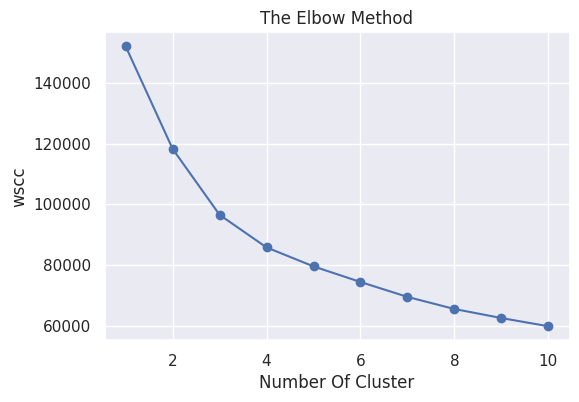

In [91]:
plt.plot(range(1,11),wscc, marker = 'o')
plt.title("The Elbow Method")
plt.xlabel("Number Of Cluster")
plt.ylabel("wscc")
plt.show()

In [92]:
model_kmean = KMeans(n_clusters=3,random_state=0).fit(X_principle)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [93]:
y_cluster = model_kmean.predict(X_principle)

In [94]:
y_cluster

array([0, 2, 1, ..., 0, 0, 0], dtype=int32)

In [95]:
silhouette_score(X_principle, y_cluster)

0.43085099690525414

In [96]:
X_principle

,P1,P2
0,-1.624789,-2.381615
1,-2.158390,2.289496
2,1.198983,0.280710
3,-0.495849,-0.185932
4,-1.632622,-1.597279
...,...,...
8945,0.320141,-2.739866
8946,-0.131128,-1.803644
8947,-0.463207,-2.990444
8948,-2.418519,-2.466634


In [97]:
df_y_cluster = pd.concat([X_principle,pd.DataFrame({'cluster':y_cluster})], axis = 1)

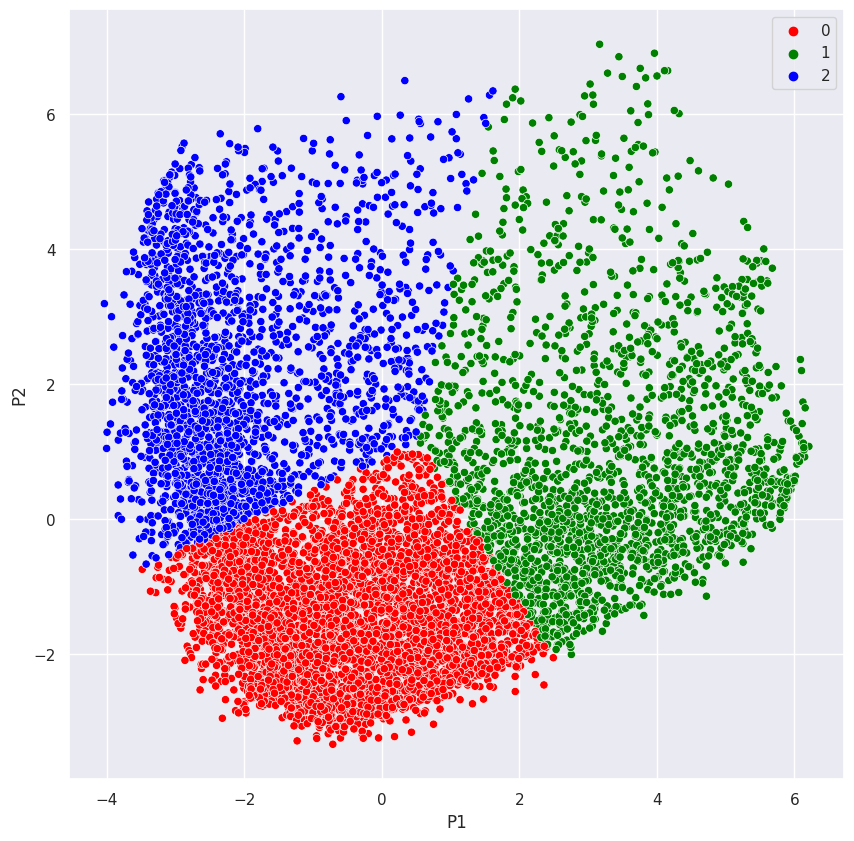

In [98]:
plt.figure(figsize=(10,10))
ax = sns.scatterplot(x="P1", y="P2", hue = y_cluster, data = X_principle, palette =['red','green','blue'])
plt.show()

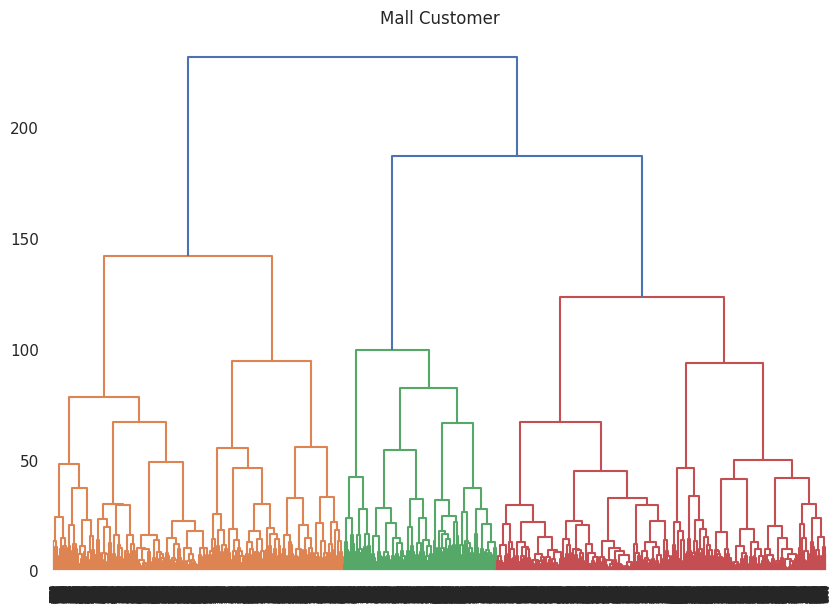

In [99]:
# Another Way To Used Linkage Metrics
from scipy.cluster.hierarchy import dendrogram,linkage
import matplotlib.pyplot as plt

plt.figure(figsize=(10,7))
plt.title("Mall Customer")
dend = dendrogram(linkage(X,method="ward"))

In [100]:
X_principle

,P1,P2
0,-1.624789,-2.381615
1,-2.158390,2.289496
2,1.198983,0.280710
3,-0.495849,-0.185932
4,-1.632622,-1.597279
...,...,...
8945,0.320141,-2.739866
8946,-0.131128,-1.803644
8947,-0.463207,-2.990444
8948,-2.418519,-2.466634


<Axes: ylabel='cluster'>

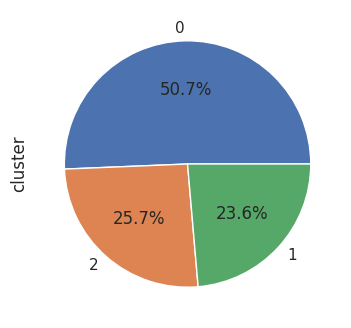

In [101]:
df_y_cluster["cluster"].value_counts().plot.pie(autopct= '%.1f%%')

#### **Agglomerative Clustering**

In [102]:
model_agg = AgglomerativeClustering(n_clusters=3).fit(X_principle)

In [103]:
y_pred = model_agg.labels_
y_pred

array([0, 2, 0, ..., 0, 0, 0])

In [104]:
silhouette_score(X_principle, y_pred)

0.40260454393255907

In [105]:
df_y_cluster

,P1,P2,cluster
0,-1.624789,-2.381615,0
1,-2.158390,2.289496,2
2,1.198983,0.280710,1
3,-0.495849,-0.185932,0
4,-1.632622,-1.597279,0
...,...,...,...
8945,0.320141,-2.739866,0
8946,-0.131128,-1.803644,0
8947,-0.463207,-2.990444,0
8948,-2.418519,-2.466634,0


In [106]:
df_y_cluster = pd.concat([df_y_cluster,pd.DataFrame({'label':y_pred})], axis = 1)

In [107]:
df_y_cluster

,P1,P2,cluster,label
0,-1.624789,-2.381615,0,0
1,-2.158390,2.289496,2,2
2,1.198983,0.280710,1,0
3,-0.495849,-0.185932,0,0
4,-1.632622,-1.597279,0,0
...,...,...,...,...
8945,0.320141,-2.739866,0,0
8946,-0.131128,-1.803644,0,0
8947,-0.463207,-2.990444,0,0
8948,-2.418519,-2.466634,0,0


<Axes: ylabel='label'>

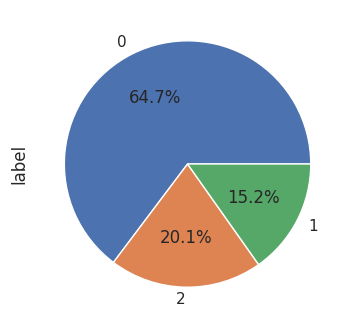

In [108]:
df_y_cluster["label"].value_counts().plot.pie(autopct= '%.1f%%')

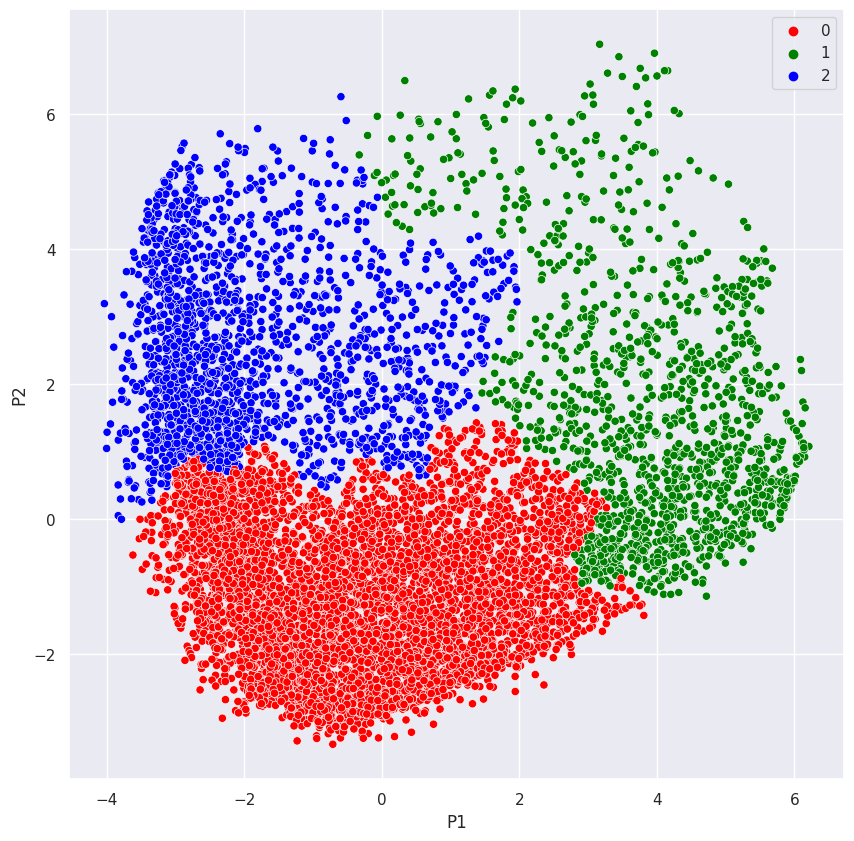

In [109]:
plt.figure(figsize=(10,10))
ax = sns.scatterplot(x="P1", y="P2", hue = y_pred, data = X_principle, palette =['red','green','blue'])
plt.show()